MACHINE LERNING PIPLEINE BY: Okello Isaac Opio

Stuyd title: 

**PREDICTORS OF INTERNALIZING MENTAL DISORDERS AMONG UGANDAN CHILDREN AND ADOLESCENTS LIVING WITH HIV: A MACHINE LEARNING APPROACH**

**Problem**

In Uganda, 12 - 27% of CA-HIV are vulnerable to IMDs, and yet their mental health needs have received limited attention. Conventional predictive methods such as Cox survival analysis lack accuracy in identifying IMD predictors, highlighting the need for a machine learning approach. In this project, we utilized the dataset from the CHAKA study (2014-2017), which contained genetic, biological, and psychosocial data as pedictors of incident and persistent mental disorder among Children and Adolecsents living with HIV in Uganda. Supervised machine learning model was developed to predict incident and persistent IMDs based on genetic, biological, and psychosocial factors. Evaluation of model performance was based on the F1 score.

**Note:** The F1 Score tries to find the balance between precision and recall by calculating their harmonic mean. It is a measure of a test’s accuracy where the highest possible value is 1. This indicates perfect precision and recall. Some may think that to balance precision and recall, we can simply opt for the average of the results. The F1 Score is a more intricate metric that allows you to get results closer to reality on imbalanced classification problems.

**General Objective**

The general objective of this study is to investigate the predictors of Internalizing Mental Disorders among Ugandan children and adolescents living with HIV using a machine learning approach. 

**Specific Objectives**
- To build a machine learning model for prediction of prevalent, incident, and persistent cases of Internalizing Mental Disorders among Ugandan children and adolescents living with HIV.
- To evaluate the performance of the machine learning model (developed in 1 above) based on each of Genetic, Biological, and Psychosocial factors respectively.
- To evaluate the performance of the machine learning model based on the combination of all the three factor domains of Genetic, Biological, and Psychosocial factors. 


**Extra Notes:**

Classification Metrics:

- Accuracy: Proportion of correct predictions out of total predictions. It's intuitive and straightforward but can be misleading with imbalanced datasets.
- Precision: Proportion of true positive predictions out of all positive predictions. Essential when the cost of false positives is high, such as in spam detection.
- Recall: Proportion of true positive predictions out of all actual positives. Critical when missing positive cases is costly, like in medical diagnoses.
- F1 Score: Harmonic mean of precision and recall. It provides a balanced measure, especially useful for imbalanced datasets.
- Specificity: Proportion of true negative predictions out of all actual negatives. Important in scenarios where false positives need to be minimized, such as in fraud detection.

Regression Metrics:
- Mean Squared Error (MSE): Average squared difference between predicted and actual values. It penalizes larger errors more due to squaring, making it sensitive to outliers.
- Root Mean Squared Error (RMSE): Square root of MSE. It maintains the same unit as the target variable, making interpretation more straightforward.
- Mean Absolute Error (MAE): Average absolute difference between predicted and actual values. Less sensitive to outliers and provides a simple measure of model performance.

**STEPS FOLLOWED**

The project roadmap
1. Prepare Libraries and Data
    - Load libraries
    - Load dataset

2. Summarize Data
    - Descriptive statistics
    - Data visualizations

3. Data Cleaning & feature Selection
    - Cleaning
    - Feature Selection
    - Data Transforms

4. Evaluate Algorithms
    - Data splitting into; train, validationa and test dataset
    - Choose evaluation metric
    - Spot Check Algorithms
    - Compare Algorithms

5. Improve Accuracy
    - Hyper-paramter Tuning 

6. Model test
    - Predictions on test dataset
    - Create standalone model for deployment

7. Feature importance selection

**Step 1 | Load Library**

In [1]:
# IMD Python Project Pipeline
# Load libraries
# Removing the warnings from the cells by importing the warnings module
import warnings
warnings.filterwarnings('ignore')  # Setting up a filter to ignore warnings. Good if you are confident with the codes

#import the necessary libraries
import pandas as pd # For the manipulation of tabular data
import numpy as np # For improved numerical calculation
from ydata_profiling import ProfileReport # For exploratory data analysis reporting
import matplotlib.pyplot as plt # For plotting
import seaborn as sns # For improved plot outlook
from matplotlib.colors import ListedColormap
%matplotlib inline 
#Tells Jupyter to display any matplotlib plots directly within the notebook, rather than in a separate. Alt: plt.show()

from sklearn.model_selection import train_test_split
from scipy.stats import boxcox
from sklearn.pipeline import Pipeline

# Importing the scaler
from sklearn.preprocessing import StandardScaler

# Importing required models and metrics

from sklearn.model_selection import StratifiedKFold, cross_val_score

# Importing classifiers based on their functionalities

# Logistic Regression: A linear model for classification tasks, often used for binary classification
from sklearn.linear_model import LogisticRegression  
# Gaussian Naive Bayes: A probabilistic classifier based on Bayes' theorem with Gaussian distribution assumption
from sklearn.naive_bayes import GaussianNB  
# K-Nearest Neighbors: A non-parametric method used for classification based on nearest training examples
from sklearn.neighbors import KNeighborsClassifier  
# Decision Tree: A non-linear model that partitions the feature space into regions to make predictions
from sklearn.tree import DecisionTreeClassifier  
# Support Vector Classifier: A powerful classifier that finds the hyperplane that best separates classes in high-dimensional space
from sklearn.svm import SVC  
# Importing ensemble classifiers
# Random Forest: An ensemble method that builds multiple decision trees and combines their predictions
from sklearn.ensemble import RandomForestClassifier  
# Gradient Boosting Classifier: An ensemble method that builds trees sequentially, each correcting the mistakes of the previous one
from sklearn.ensemble import GradientBoostingClassifier  
# AdaBoost Classifier: An ensemble method that combines multiple weak learners to build a strong classifier
from sklearn.ensemble import AdaBoostClassifier  

In [2]:
# Set the resolution of the plotted figures
plt.rcParams['figure.dpi'] = 200

# Configure Seaborn plot styles: Set background color and use dark grid
sns.set_theme(rc={'axes.facecolor': '#faded9'}, style='darkgrid')

**Step 2 | Read Dataset**

In [3]:
import pandas as pd

# Define columns and their respective data types; str = strings, floats = numericals
dtype_mapping = {
    'PatientID': str,'Age': float, 'AgeCategory': str, 'Gender_of_Child': str, 'Religion': str,
       'Childs_Education_Level': str, 'BMI_category': str, 'childtrib1': str, 'orphanhood': str,
       'Socio_Economic_Status': str, 'Support_Program': str, 'Child_Takes_ART': str, 'Worst_HIV_Stage': str,
       'Premature_Birth': str, 'Born_with_HIV': str, 'Stress': str, 'GroupCategory': str,
       'cd4takeoff1': float, 'CD4_category': str, 'Viralload': float, 'Viralload_Category': str,
       'Baseline_telomere_length': float, 'Telomere_length_12Months': float, 'tldiff': float,
       'telomere_length_change': str, 'stin2vntr_': str, 'httlpr1_polymorphism': str,
       'HTTLPRrs35531': str, 'rs35531_polymorphism': str, 'Rs10482605_polymorphism': str,
       'Rs1360780_polymorphism': str, 'rs1386494_polymorphism': str, 'rs1843809_polymorphism': str, 'rs34517220_polymorphism': str,
       'rs4570625_polymorphism': str,'GroupCategory':str,'GAD': float, 'MDD': float, 'PTSD': float,'IMDs': float
       }

# Read the CSV file with specified data types
IMD_Dataset = pd.read_csv("DATA ML INCIDENT NEW NEW 30 SEP 2024.csv", dtype=dtype_mapping, encoding='latin1')

# Display the first few rows of the DataFrame
IMD_Dataset.head(3)


,PatientID,Age,AgeCategory,Gender_of_Child,Religion,Childs_Education_Level,BMI_category,childtrib1,orphanhood,Socio_Economic_Status,...,Rs1360780_polymorphism,rs1386494_polymorphism,rs1843809_polymorphism,rs34517220_polymorphism,rs4570625_polymorphism,GroupCategory,GAD,MDD,PTSD,IMDs
0,CHAKA/02/04/1366,10.554410,Adolescent,Female,Christian,Pre-primary,Underweight,Muganda,Both parents dead,high socioecnomic status,...,C:C,NaN,NaN,NaN,G:G,controls,0.0,0.0,1.0,1.0
1,CHAKA/02/09/0681,9.880903,Adolescent,Female,Christian,Pre-primary,Underweight,Non-Munganda but Ugandan,Both parents alive,high socioecnomic status,...,C:T,G:A,T:G,A:A,G:G,controls,0.0,0.0,0.0,0.0
2,CHAKA/02/01/0041,7.515400,Adolescent,Female,Christian,Pre-primary,Underweight,Non-Munganda but Ugandan,Single parent alive,low socio-economic status,...,C:C,G:G,T:T,A:A,G:G,controls,0.0,0.0,0.0,0.0


**Data Descripition**

Summarize Data

In [4]:
# a) Descriptive statistics
IMD_Dataset.info()

IMD_Dataset.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 368 entries, 0 to 367
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   PatientID                 368 non-null    object 
 1   Age                       351 non-null    float64
 2   AgeCategory               368 non-null    object 
 3   Gender_of_Child           367 non-null    object 
 4   Religion                  367 non-null    object 
 5   Childs_Education_Level    367 non-null    object 
 6   BMI_category              366 non-null    object 
 7   childtrib1                367 non-null    object 
 8   orphanhood                358 non-null    object 
 9   Socio_Economic_Status     368 non-null    object 
 10  Support_Program           364 non-null    object 
 11  Stress                    368 non-null    object 
 12  Premature_Birth           367 non-null    object 
 13  Born_with_HIV             367 non-null    object 
 14  Child_Take

(368, 39)

**Inferences**

DataFrame Characteristics
- The DataFrame has 368 entries (rows) and 39 columns.
- The data types were both floats and strings.

Column Information

- The dataset contains various columns that provide detailed information about demographic, biological, psychosocial, and genetic factors. These include variables such as 'PatientID', 'Age', 'AgeCategory', 'Gender_of_Child', 'Religion','Childs_Education_Level', 'BMI_category', 'childtrib1', 'orphanhood', 'Socio_Economic_Status', 'Support_Program', 'Stress', 'Premature_Birth','Born_with_HIV', 'Child_Takes_ART', 'Worst_HIV_Stage', 'cd4takeoff1','CD4_category', 'Viralload', 'Viralload_Category','Baseline_telomere_length', 'Telomere_length_12Months', 'tldiff','telomere_length_change', 'stin2vntr_', 'httlpr1_polymorphism', 'HTTLPRrs35531', 'rs35531_polymorphism', 'Rs10482605_polymorphism','Rs1360780_polymorphism', 'rs1386494_polymorphism', 'rs1843809_polymorphism', 'rs34517220_polymorphism','rs4570625_polymorphism', 'GroupCategory', 'GAD', 'MDD', 'PTSD','IMDs'.

- Some columns have missing data, with the number of non-null values ranging from 302 to 368 out of the total 368 rows.

**Summary Statistics for Numerical variables**

In [5]:
#Get the summary statistics for numerical data
IMD_Dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,351.0,10.490522,3.207305,4.999316,7.724846,10.094460,13.000000,1.711431e+01
cd4takeoff1,366.0,944.019126,553.733680,11.000000,546.500000,892.000000,1221.750000,3.924000e+03
Viralload,309.0,33445.058252,177615.817881,0.000000,0.000000,10.000000,1450.000000,2.621863e+06
Baseline_telomere_length,306.0,1.096681,0.353820,0.019943,0.883237,1.065063,1.325456,2.179359e+00
Telomere_length_12Months,274.0,0.884187,0.274839,0.334023,0.715534,0.836745,0.989858,2.189877e+00
tldiff,234.0,0.234441,0.415458,-1.233903,0.021327,0.192954,0.465857,1.260447e+00
GAD,368.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00
MDD,368.0,0.027174,0.162811,0.000000,0.000000,0.000000,0.000000,1.000000e+00
PTSD,368.0,0.059783,0.237406,0.000000,0.000000,0.000000,0.000000,1.000000e+00
IMDs,368.0,0.084239,0.278124,0.000000,0.000000,0.000000,0.000000,1.000000e+00


**Inference on descriptive**

- The dataset included 345 participants with an average age of 10.66 years, ranging from 4.53 to 17 years. The CD4 count at baseline (cd4takeoff1) had a mean of 947, with significant variability (SD = 513.96), and ranged from 11 to 2627. Viral load data, collected from 302 participants, showed a wide range, with an average of 26,976 (SD = 129,553) and values spanning from 0 to over 1.25 million. Baseline telomere length, available for 307 participants, averaged 1.20 units (SD = 0.36) and ranged from 0.11 to 2.13, while telomere length at 12 months (data from 278 participants) averaged 0.93 units (SD = 0.34), with a range of 0.19 to 2.19. The difference in telomere length over time (tldiff), calculated for 231 participants, had a mean of 0.26 (SD = 0.47), with values ranging from -1.21 to 1.50. For mental health outcomes, the Generalized Anxiety Disorder (GAD) measure showed no cases, while Major Depressive Disorder (MDD) had a prevalence of 7.34%, and Post-Traumatic Stress Disorder (PTSD) was present in 14.40% of participants. Lastly, 20.11% of the participants were reported to have internalizing mental disorders (IMDs).

 EDA

The analysis consists of two key steps:

Univariate analysis: Examines the distribution of each variable individually to understand its characteristics.
Bivariate analysis: Explores the relationship between each feature and the target variable, helping assess the importance and influence of each feature on the target outcome.

These steps provide valuable insights into both the individual data features and their impact on predicting the target variable, IMD.

**Univariate Analysis**

We undertake univariate analysis on the dataset's features, based on their datatype:

- For continuous data: We employ histograms to gain insight into the distribution of each feature. This allows us to understand the central tendency, spread, and shape of the dataset's distribution.
- For categorical data: Bar plots are utilized to visualize the frequency of each category. This provides a clear representation of the prominence of each category within the respective feature.
By employing these visualization techniques, we're better positioned to understand the individual characteristics of each feature in the dataset.

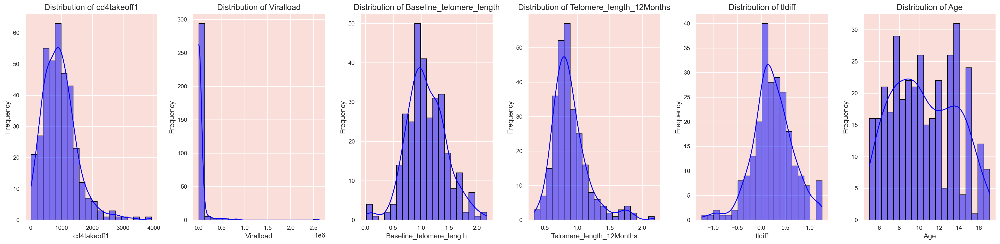

In [6]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Given variable names
variables_of_interest = ['cd4takeoff1', 'Viralload', 'Baseline_telomere_length', 'Telomere_length_12Months', 'tldiff', 'Age']

# Select only the specified variables from the dataset
selected_variables = IMD_Dataset[variables_of_interest]

# Define colors
hist_color = 'blue'
kde_color = 'red'

# Set up the subplot with larger size
fig, ax = plt.subplots(nrows=1, ncols=len(variables_of_interest), figsize=(24, 6))  # Increased figure size

# Loop to plot histograms for each selected variable
for i, var in enumerate(selected_variables.columns):
    sns.histplot(selected_variables[var], bins=20, color=hist_color, edgecolor='black', kde=True, line_kws={'color': kde_color}, ax=ax[i])
    
    # Increase font sizes and spacing for better readability
    ax[i].set_title(f'Distribution of {var}', fontsize=14)
    ax[i].set_xlabel(var, fontsize=12)
    ax[i].set_ylabel('Frequency', fontsize=12)
    ax[i].tick_params(axis='both', which='major', labelsize=10)
    ax[i].grid(True)

# Add more space between subplots
plt.subplots_adjust(wspace=0.3)  # Increased space between plots
plt.tight_layout()
plt.show()


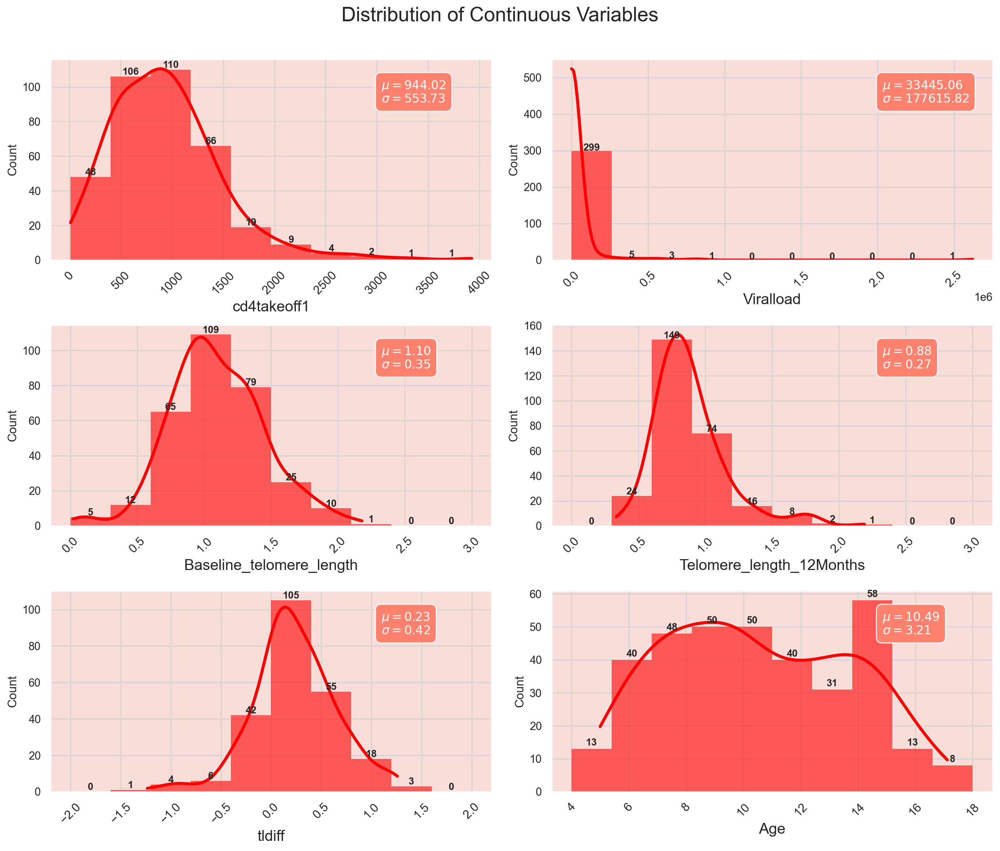

In [7]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the required variable names
variables_of_interest = ['cd4takeoff1', 'Viralload','Baseline_telomere_length', 'Telomere_length_12Months', 'tldiff', 'Age']

# Filter out continuous features for the univariate analysis
df_continuous = IMD_Dataset[variables_of_interest]

# Adjust the number of rows and columns for better spacing
n_cols = 2
n_rows = int(np.ceil(len(variables_of_interest) / n_cols))

# Set up the subplot with taller y-axis by increasing figure height
fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(14, 12))  # Increased height

# Flatten the axes array for easier iteration
ax = ax.flatten()

# Loop to plot histograms for each continuous feature
for i, col in enumerate(df_continuous.columns):
    values, bin_edges = np.histogram(df_continuous[col], 
                                     range=(np.floor(df_continuous[col].min()), np.ceil(df_continuous[col].max())))
    
    graph = sns.histplot(data=df_continuous, x=col, bins=bin_edges, kde=True, ax=ax[i],
                         edgecolor='none', color='red', alpha=0.6, line_kws={'lw': 3})
    
    ax[i].set_xlabel(col, fontsize=15)
    ax[i].set_ylabel('Count', fontsize=12)
    ax[i].tick_params(axis='x', rotation=45, labelsize=12)  # Rotate and increase font size for x-axis
    ax[i].grid(color='lightgrey')

    # Annotate bars with their heights
    for j, p in enumerate(graph.patches):
        ax[i].annotate('{}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height() + 1),
                       ha='center', fontsize=10, fontweight="bold")
    
    # Display mean and std deviation on the plot
    textstr = '\n'.join((
        r'$\mu=%.2f$' % df_continuous[col].mean(),
        r'$\sigma=%.2f$' % df_continuous[col].std()
    ))
    ax[i].text(0.75, 0.9, textstr, transform=ax[i].transAxes, fontsize=12, verticalalignment='top',
               color='white', bbox=dict(boxstyle='round', facecolor='#ff826e', edgecolor='white', pad=0.5))

# Hide any unused subplots
for j in range(i + 1, len(ax)):
    ax[j].set_visible(False)

plt.suptitle('Distribution of Continuous Variables', fontsize=20)
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


Categorical Univariate Analysis



In [8]:
categorical_features=IMD_Dataset.columns.difference(variables_of_interest)
df_categorical=IMD_Dataset[categorical_features]

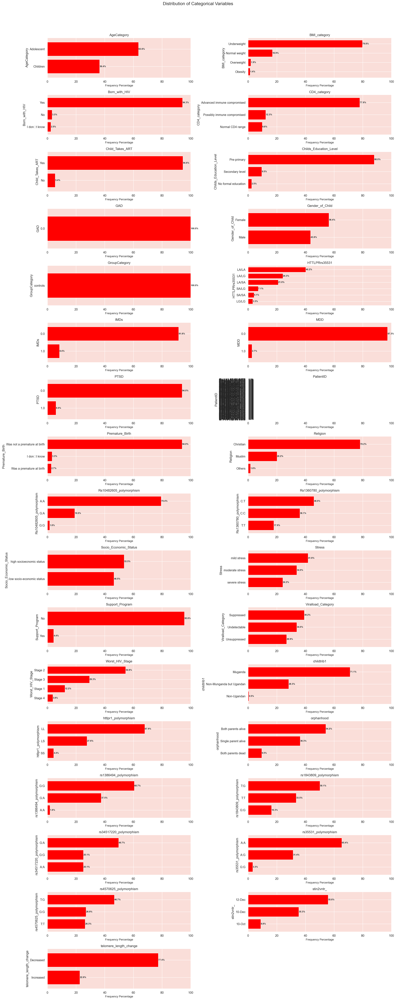

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Given variable names
variables_of_interest = ['cd4takeoff1', 'Viralload','Baseline_telomere_length', 'Telomere_length_12Months', 'tldiff', 'Age']

# Select categorical features
categorical_features = IMD_Dataset.columns.difference(variables_of_interest)
df_categorical = IMD_Dataset[categorical_features]

# Determine the number of rows needed (adjust if needed)
n_features = len(categorical_features)
n_cols = 2
n_rows = (n_features + n_cols - 1) // n_cols

# Set up the subplot
fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, n_rows * 3))

# Loop to plot bar charts for each categorical feature
for i, col in enumerate(categorical_features):
    row = i // n_cols
    col_idx = i % n_cols
    
    # Calculate frequency percentages
    value_counts = IMD_Dataset[col].value_counts(normalize=True).mul(100).sort_values()
    
    # Plot bar chart
    value_counts.plot(kind='barh', ax=ax[row, col_idx], width=0.8, color='red')
    
    # Add frequency percentages to the bars
    for index, value in enumerate(value_counts):
        ax[row, col_idx].text(value, index, f'{value:.1f}%', fontsize=8, weight='bold', va='center')
    
    ax[row, col_idx].set_xlim([0, 100])
    ax[row, col_idx].set_xlabel('Frequency Percentage', fontsize=10)
    ax[row, col_idx].set_title(f'{col}', fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(ax[j // n_cols, j % n_cols])

plt.suptitle('Distribution of Categorical Variables', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


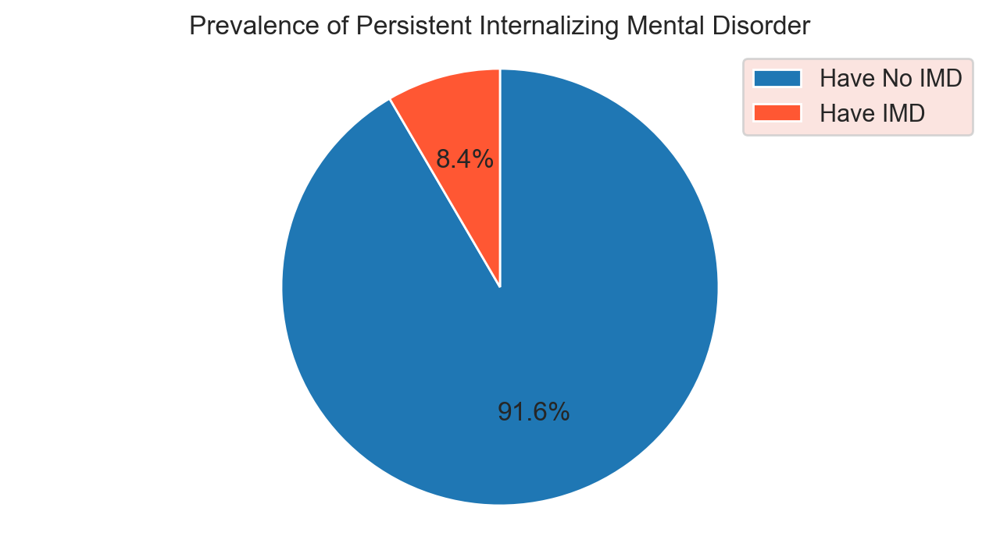

In [10]:
# Define colors for the pie chart
colors = ['#1F77B4', '#FF5733']

# Proportion of fetal health classes
plt.figure(figsize=(8, 4))  # Set the figure size
plt.pie(IMD_Dataset['IMDs'].value_counts(), startangle=90, counterclock=False, autopct='%1.1f%%', wedgeprops={'width': 1}, colors=colors)
plt.axis('equal')  # Set equal aspect ratio to make it a complete circle
plt.legend(['Have No IMD', 'Have IMD'])  # Set the legend labels
plt.title("Prevalence of Persistent Internalizing Mental Disorder")  # Set the title
plt.show()


BIVARIATE ANALYSIS

For our bivariate analysis on the dataset's features with respect to the target variable:

For continuous data: I am going to use bar plots to showcase the average value of each feature for the different target classes, and KDE plots to understand the distribution of each feature across the target classes. This aids in discerning how each feature varies between the two target outcomes.
For categorical data: I am going to employ 100% stacked bar plots to depict the proportion of each category across the target classes. This offers a comprehensive view of how different categories within a feature relate to the target.

Through these visualization techniques, we are going to gain a deeper understanding of the relationship between individual features and the target, revealing potential predictors for heart disease.

Numerical Features Vs Target

I am going to visualize each continuous feature against the target using two types of charts:

- Bar plots - showing the mean values.
- KDE plots - displaying the distribution for each target category.

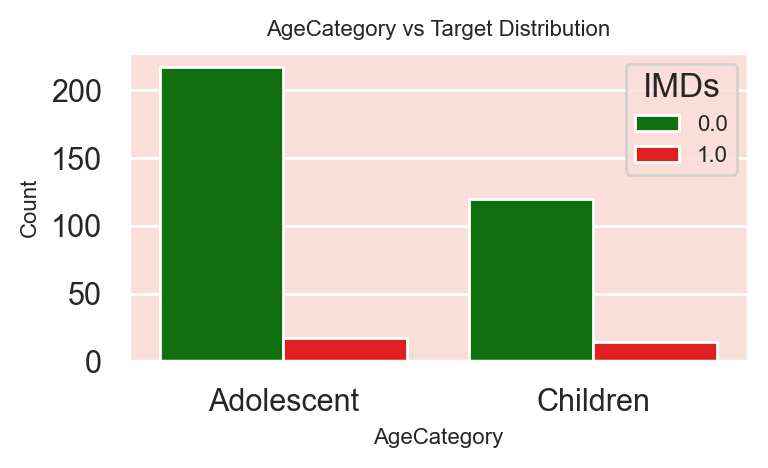

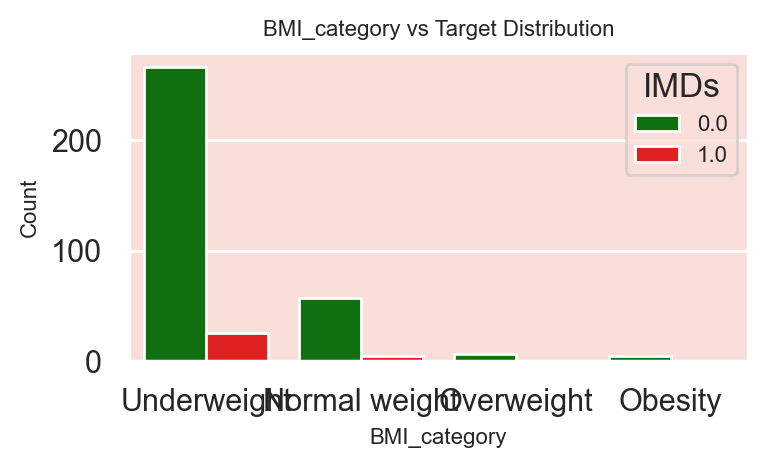

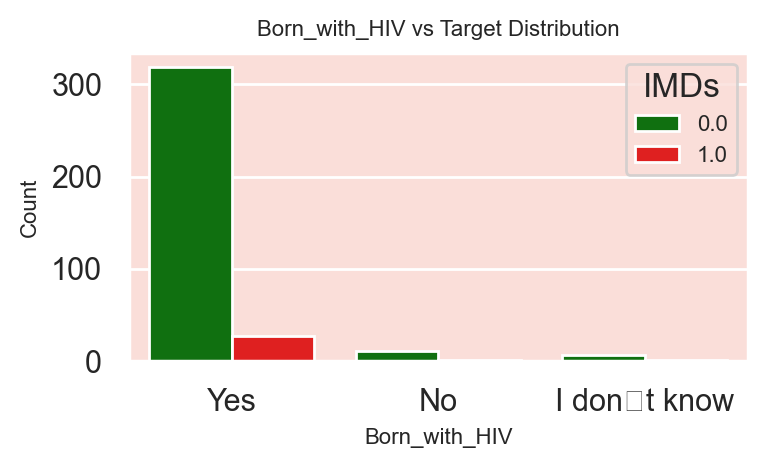

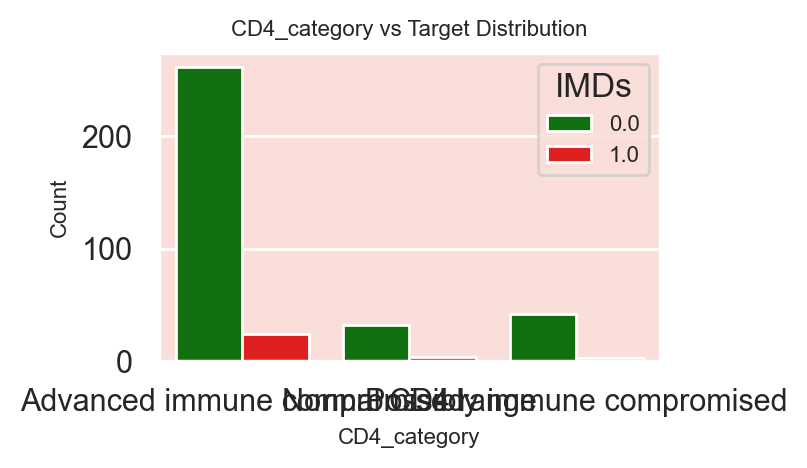

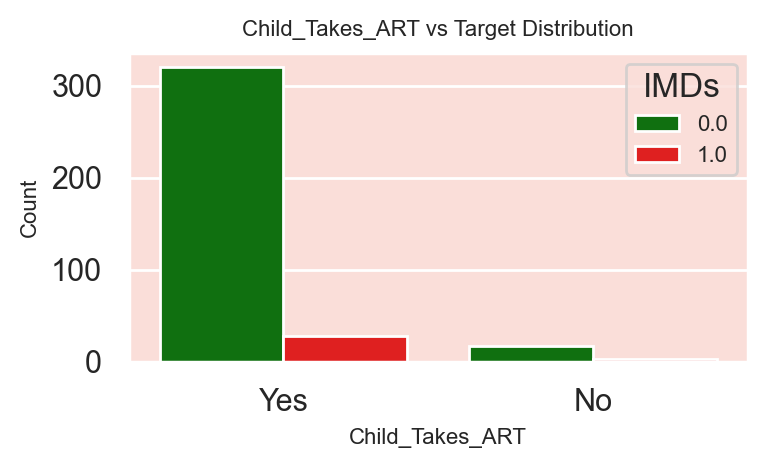

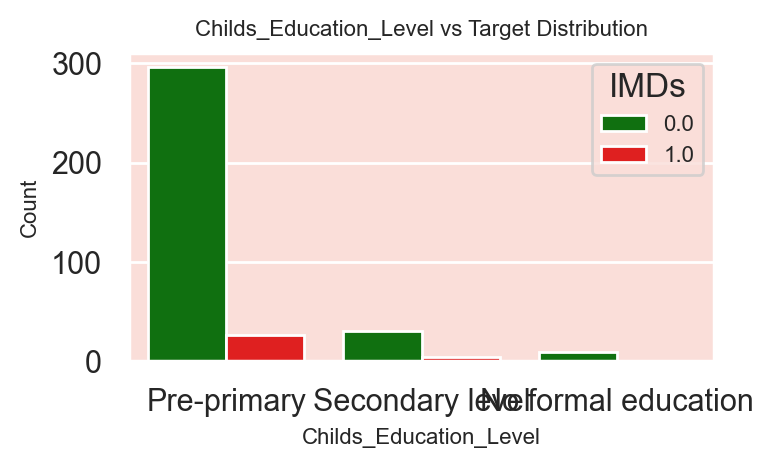

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


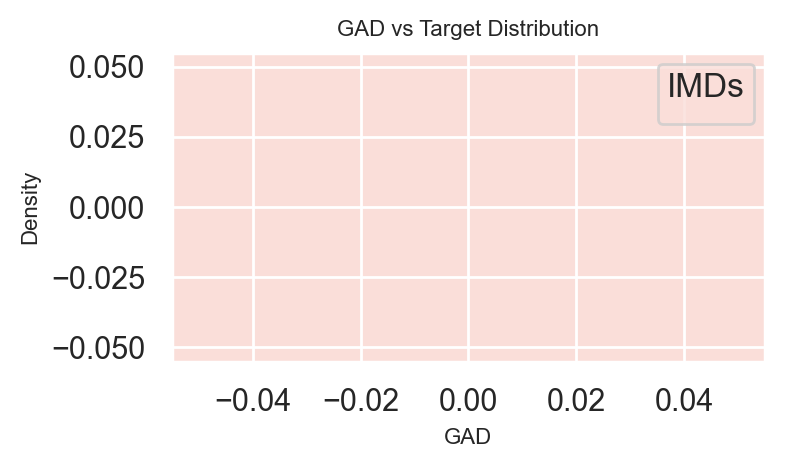

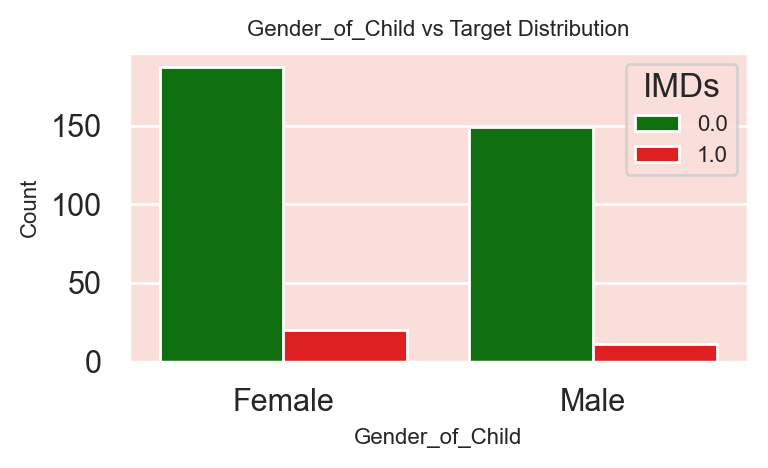

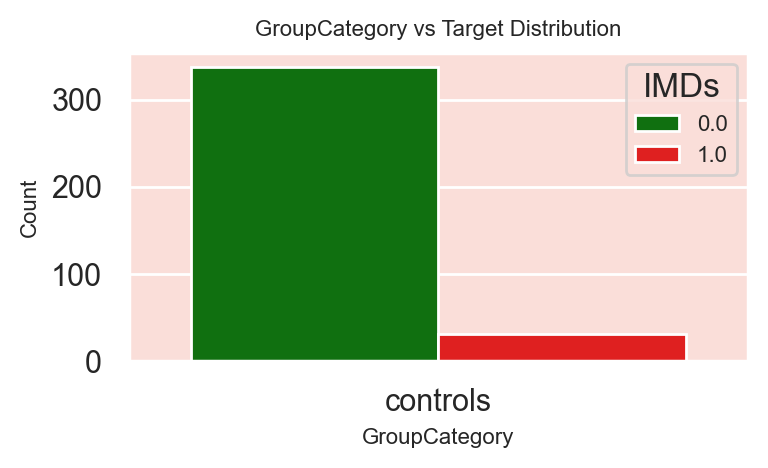

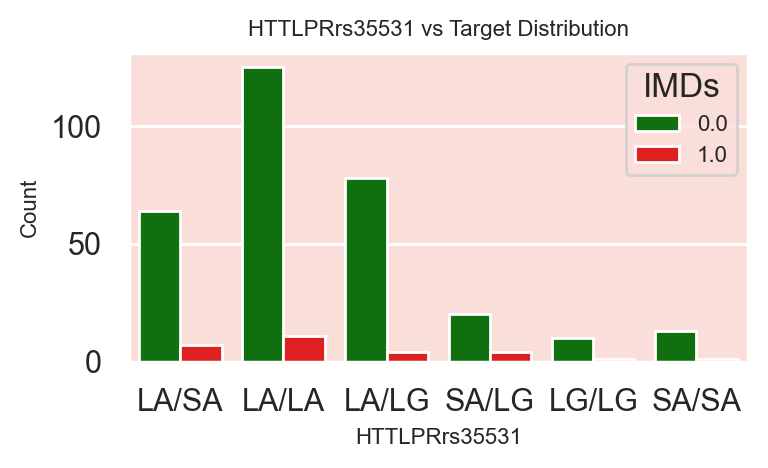

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


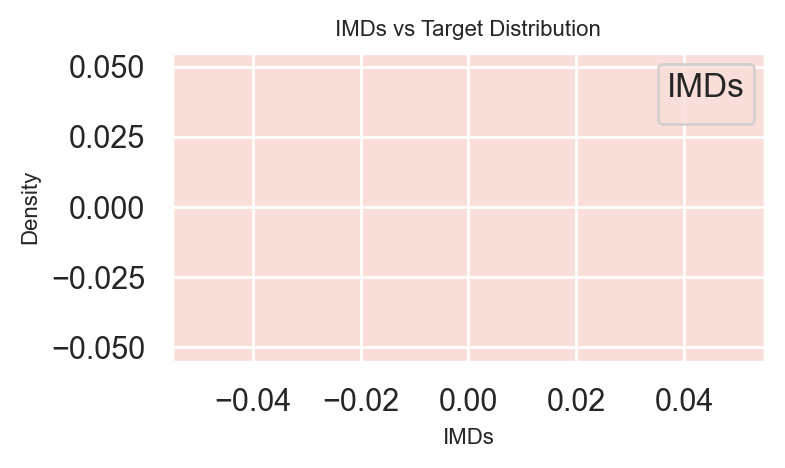

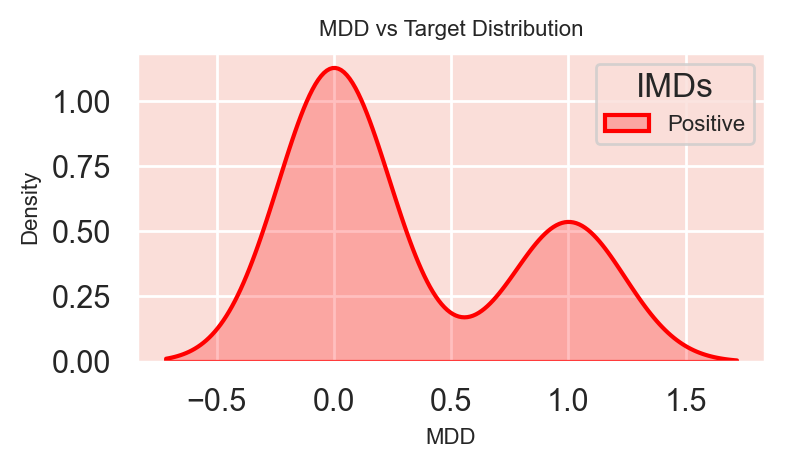

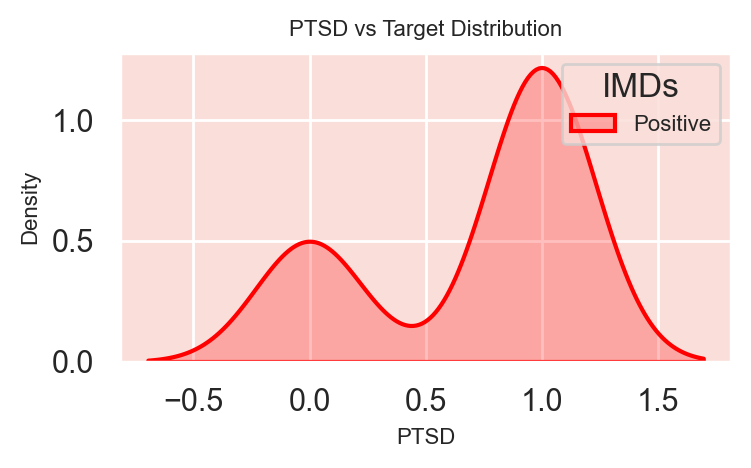

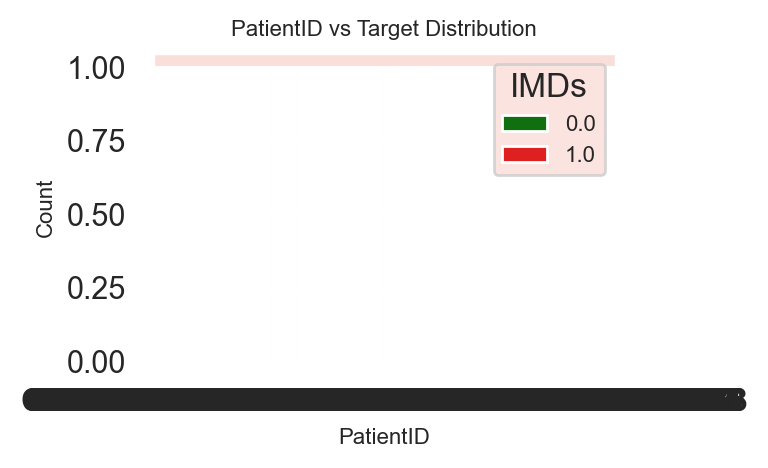

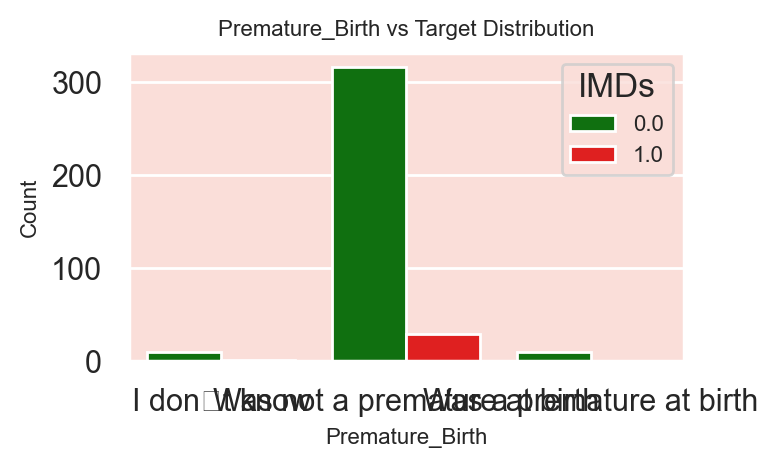

...

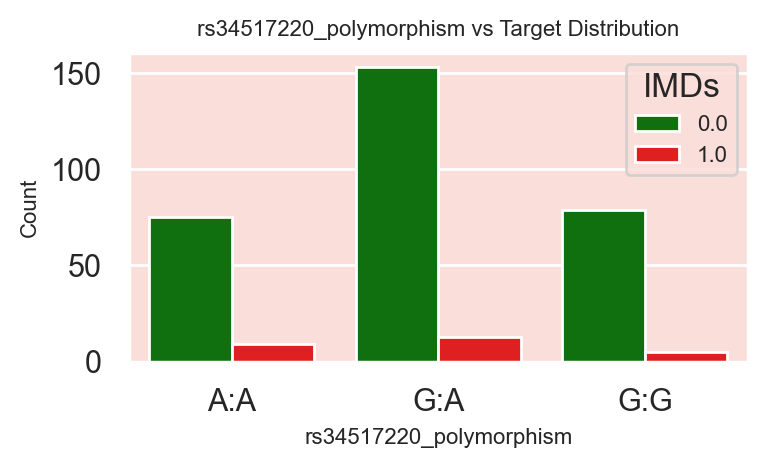

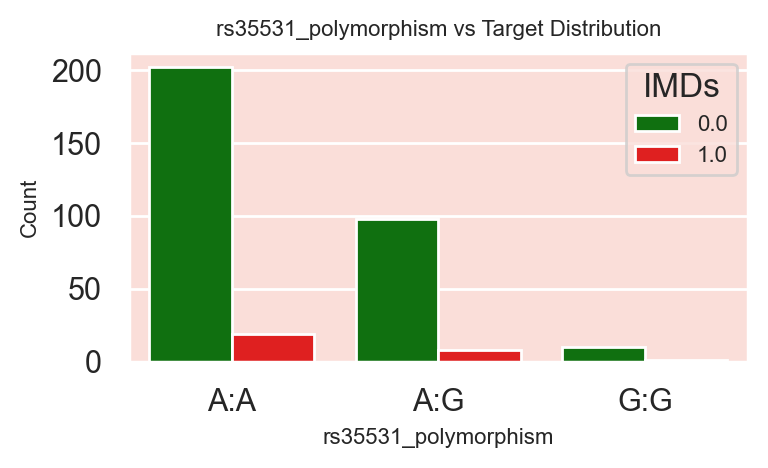

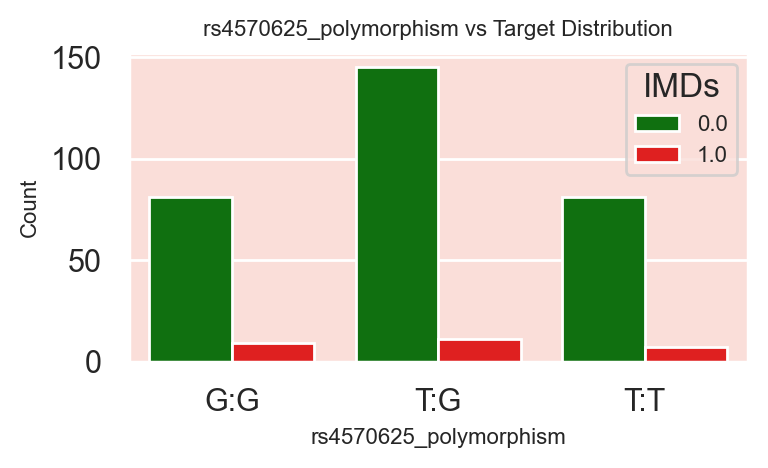

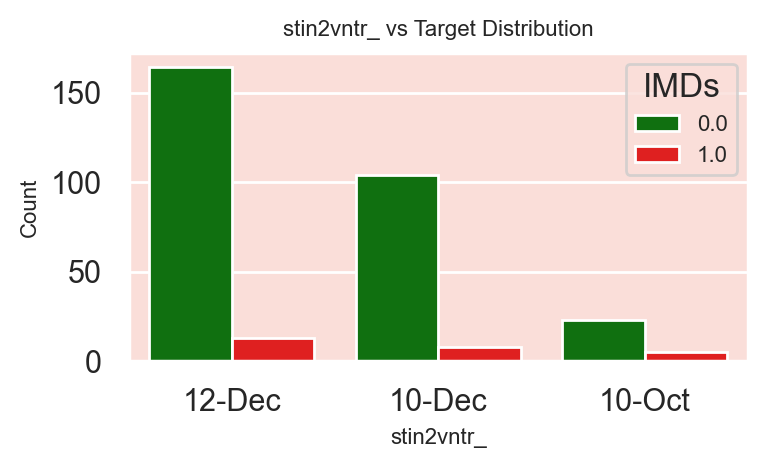

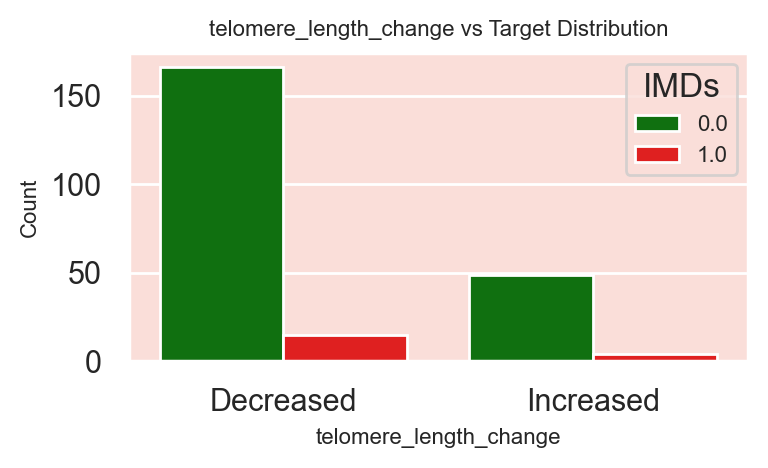

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder for the target variable 'IMDs'
label_encoder = LabelEncoder()

# Assume IMD_Dataset is defined somewhere before this code snippet
# Make a copy of the dataset for plotting
IMD_Plot_Data = IMD_Dataset.copy()

# Given variable names
variables_of_interest = ['cd4takeoff1', 'Viralload', 'Baseline_telomere_length', 'Telomere_length_12Months', 'tldiff', 'Age']

# Select categorical features
df_categorical = IMD_Plot_Data.columns.difference(variables_of_interest)
categorical_features = IMD_Plot_Data[df_categorical]

# Encode the target variable 'IMDs' if it's categorical
if IMD_Plot_Data['IMDs'].dtype == 'object' or IMD_Plot_Data['IMDs'].dtype.name == 'category':
    IMD_Plot_Data['IMDs'] = label_encoder.fit_transform(IMD_Plot_Data['IMDs'])

# Set color palette
sns.set_palette(['green', 'red'])

# Separate features and target variable
target1 = IMD_Plot_Data['IMDs']

# Uniform font size
font_size = 8

# Loop through each categorical feature to create individual plots
for col in categorical_features.columns:
    plt.figure(figsize=(4, 2.5))  # Further reduced figure size
    if IMD_Plot_Data[col].dtype == 'object' or IMD_Plot_Data[col].dtype.name == 'category':
        # Countplot showing the distribution of the feature for each target category
        sns.countplot(x=IMD_Plot_Data[col], hue=target1)
        plt.xlabel(col, fontsize=font_size)  # Uniform font size for x-label
        plt.ylabel('Count', fontsize=font_size)  # Uniform font size for y-label
        plt.legend(title='IMDs', loc='upper right', fontsize=font_size)  # Uniform font size for legend
    else:
        # KDE plot showing the distribution of the feature for each target category
        sns.kdeplot(data=IMD_Plot_Data[IMD_Plot_Data["IMDs"] == 0], x=col, fill=True, linewidth=1.5, label='Negative')
        sns.kdeplot(data=IMD_Plot_Data[IMD_Plot_Data["IMDs"] == 1], x=col, fill=True, linewidth=1.5, label='Positive')
        plt.xlabel(col, fontsize=font_size)  # Uniform font size for x-label
        plt.ylabel('Density', fontsize=font_size)  # Uniform font size for y-label
        plt.legend(title='IMDs', loc='upper right', fontsize=font_size)  # Uniform font size for legend
    
    # Set the title for the figure with uniform font size
    plt.title(f'{col} vs Target Distribution', fontsize=font_size)
    plt.tight_layout()
    plt.show()


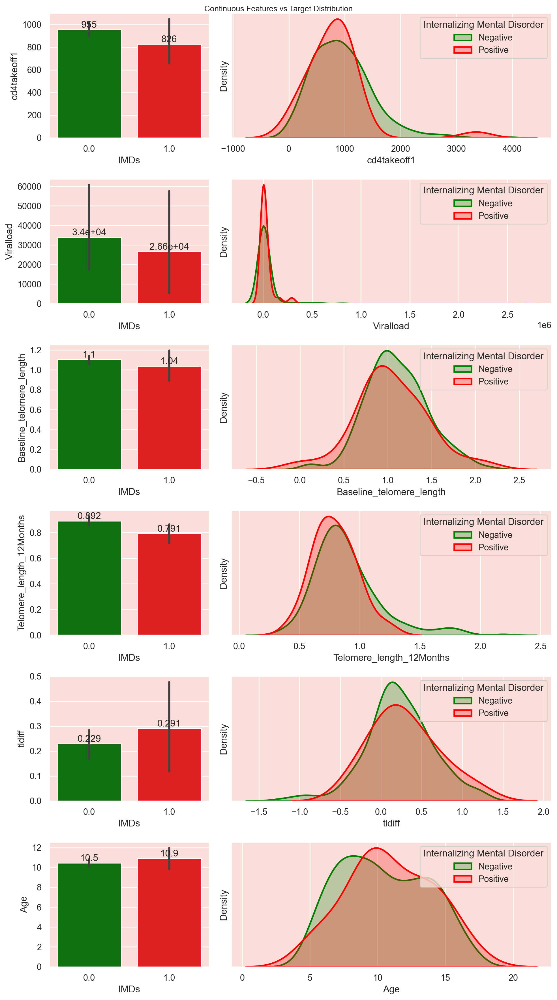

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# Given variable names
variables_of_interest = ['cd4takeoff1', 'Viralload', 'Baseline_telomere_length', 'Telomere_length_12Months', 'tldiff', 'Age']
continuous_features = variables_of_interest

# Select categorical features
df_categorical = IMD_Plot_Data.columns.difference(variables_of_interest)
categorical_features = IMD_Plot_Data[df_categorical]

# Set color palette
sns.set_palette(['green', 'red'])

# Separate features and target variable
target1 = IMD_Plot_Data['IMDs']

# Create the subplots with taller y-axis
fig, ax = plt.subplots(len(continuous_features), 2, figsize=(10, 18), gridspec_kw={'width_ratios': [1, 2], 'height_ratios': [1] * len(continuous_features)})

# Loop through each continuous feature to create barplots and KDE plots
for i, col in enumerate(continuous_features):
    # Barplot showing the mean value of the feature for each target category
    graph = sns.barplot(data=IMD_Plot_Data, x=target1, y=col, ax=ax[i, 0])
    
    # KDE plot showing the distribution of the feature for each target category
    sns.kdeplot(data=IMD_Plot_Data[IMD_Plot_Data["IMDs"] == 0], x=col, fill=True, linewidth=2, ax=ax[i, 1], label='Negative')
    sns.kdeplot(data=IMD_Plot_Data[IMD_Plot_Data["IMDs"] == 1], x=col, fill=True, linewidth=2, ax=ax[i, 1], label='Positive')
    
    # Remove y-axis ticks for the KDE plot
    ax[i, 1].set_yticks([])
    ax[i, 1].legend(title='Internalizing Mental Disorder', loc='upper right')
    
    # Add mean values to the barplot
    for cont in graph.containers:
        graph.bar_label(cont, fmt='%.3g')
        
# Set the title for the entire figure
plt.suptitle('Continuous Features vs Target Distribution', fontsize=10)
plt.tight_layout()  # Ensure no overlap of subplots
plt.show()


Bivariate for Categorical Features

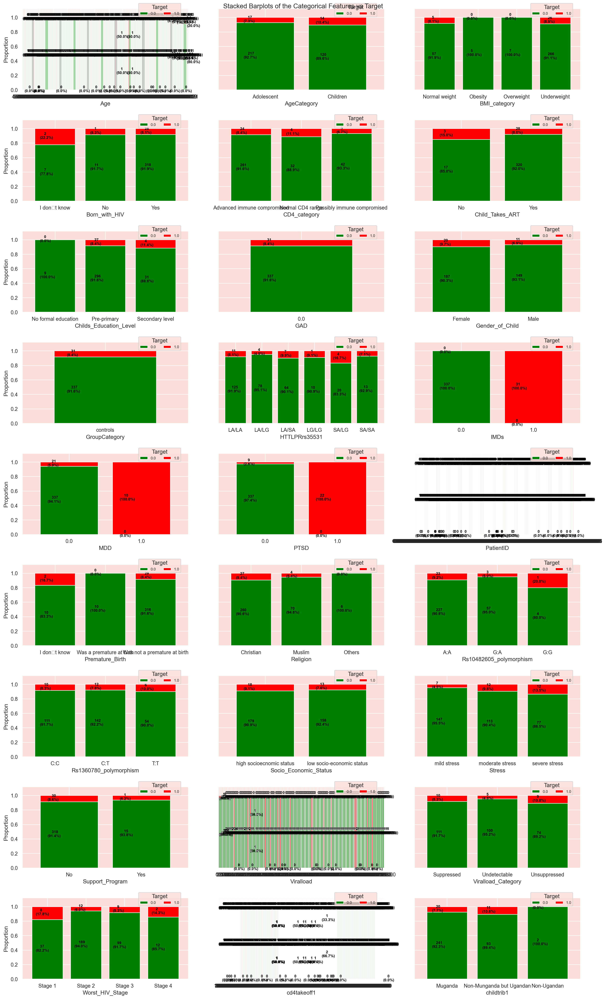

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from matplotlib.colors import ListedColormap
import numpy as np

# Initialize LabelEncoder for the target variable 'IMDs'
label_encoder = LabelEncoder()

# Given variable names
variables_of_interest = ['Baseline_telomere_length', 'Telomere_length_12Months', 'Telomere_Lenth_Difference']

# Assuming IMD_Dataset is defined somewhere before this code snippet
# Make a copy of the dataset for plotting
IMD_Plot_Data = IMD_Dataset.copy()

# Select categorical features
df_categorical = IMD_Plot_Data.columns.difference(variables_of_interest)
categorical_features = IMD_Plot_Data[df_categorical]

# Encode the target variable 'IMDs' if it's categorical
if IMD_Plot_Data['IMDs'].dtype == 'object' or IMD_Plot_Data['IMDs'].dtype.name == 'category':
    IMD_Plot_Data['IMDs'] = label_encoder.fit_transform(IMD_Plot_Data['IMDs'])

# Initialize figure with adjusted size
fig, ax = plt.subplots(nrows=9, ncols=3, figsize=(18, 30))
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.5, wspace=0.3)

# Loop through each categorical feature
for i, col in enumerate(categorical_features.columns):
    if i < 27:  # Ensure you don't exceed the number of subplots (9 rows * 3 columns = 27)
        # Calculate subplot indices
        x, y = i // 3, i % 3

        # Create a cross tabulation showing the proportion of categories for each target category
        cross_tab = pd.crosstab(index=IMD_Plot_Data[col], columns=IMD_Plot_Data['IMDs'])
        cross_tab_prop = pd.crosstab(index=IMD_Plot_Data[col], columns=IMD_Plot_Data['IMDs'], normalize='index')

        # Define colormap
        cmp = ListedColormap(['green', 'red'])

        # Plot stacked bar chart
        cross_tab_prop.plot(kind='bar', ax=ax[x, y], stacked=True, width=0.8, colormap=cmp,
                            legend=False, ylabel='Proportion', sharey=True)
     
        # Add annotations (proportions and counts) to the bars
        for idx, val in enumerate(cross_tab_prop.index):
            for (proportion, count, y_location) in zip(cross_tab_prop.loc[val], cross_tab.loc[val],
                                                       cross_tab_prop.loc[val].cumsum()):
                ax[x, y].text(x=idx - 0.3, y=(y_location - proportion) + (proportion / 2) - 0.03,
                              s=f'    {count}\n({np.round(proportion * 100, 1)}%)',
                              color="black", fontsize=8, fontweight="bold")      

        # Add legend, set y limit, and rotate xticks
        ax[x, y].legend(title='Target', loc=(0.7, 0.9), fontsize=8, ncol=2)
        ax[x, y].set_ylim([0, 1.12])
        ax[x, y].set_xticklabels(ax[x, y].get_xticklabels(), rotation=0)

# Adjust figure title and layout
plt.suptitle('Stacked Barplots of the Categorical Features vs Target', fontsize=14)
plt.tight_layout()
plt.show()


DATA PRE-PROCESSING

*Outlier Detection*

I am going to detect the outliers uding the Interquartile Range (IQR) Method for Outlier Detection for the continous features


In [14]:
continuous_features

['cd4takeoff1',
 'Viralload',
 'Baseline_telomere_length',
 'Telomere_length_12Months',
 'tldiff',
 'Age']

In [15]:
Q1 = IMD_Dataset[continuous_features].quantile(0.25)
Q3 = IMD_Dataset[continuous_features].quantile(0.75)
IQR = Q3 - Q1
outliers_count_specified = ((IMD_Dataset[continuous_features] < (Q1 - 1.5 * IQR)) | (IMD_Dataset[continuous_features] > (Q3 + 1.5 * IQR))).sum()
outliers_count_specified

cd4takeoff1                 11
Viralload                   67
Baseline_telomere_length     8
Telomere_length_12Months    14
tldiff                      14
Age                          0
dtype: int64

**Sensitivity to Outliers:**

SVM (Support Vector Machine): SVMs can be sensitive to outliers. While the decision boundary is determined primarily by the support vectors, outliers can influence which data points are chosen as support vectors, potentially leading to suboptimal classification.
Decision Trees (DT) and Random Forests (RF): These tree-based algorithms are generally robust to outliers. They make splits based on feature values, and outliers often end up in leaf nodes, having minimal impact on the overall decision-making process.
K-Nearest Neighbors (KNN): KNN is sensitive to outliers because it relies on distances between data points to make predictions. Outliers can distort these distances.
AdaBoost: This ensemble method, which often uses decision trees as weak learners, is generally robust to outliers. However, the iterative nature of AdaBoost can sometimes lead to overemphasis on outliers, making the final model more sensitive to them.

**Approaches for Outlier Treatment:**

Removal of Outliers: Directly discard data points that fall outside of a defined range, typically based on a method like the Interquartile Range (IQR).
Capping Outliers: Instead of removing, we can limit outliers to a certain threshold, such as the 1st or 99th percentile.
Transformations: Applying transformations like log or Box-Cox can reduce the impact of outliers and make the data more Gaussian-like.
Robust Scaling: Techniques like the RobustScaler in Scikit-learn can be used, which scales features using statistics that are robust to outliers.

**Conclusion:**
Given the nature of the algorithms (especially SVM and KNN) and the small size of our dataset, direct removal of outliers might not be the best approach. Instead, I focussed on applying MinMax Scaling in the subsequent steps to reduce the impact of outliers and make the data more suitable for modeling.

In [16]:
# List variable names
variable_names = IMD_Dataset.columns.tolist()

# Print the variable names
print(variable_names)

['PatientID', 'Age', 'AgeCategory', 'Gender_of_Child', 'Religion', 'Childs_Education_Level', 'BMI_category', 'childtrib1', 'orphanhood', 'Socio_Economic_Status', 'Support_Program', 'Stress', 'Premature_Birth', 'Born_with_HIV', 'Child_Takes_ART', 'Worst_HIV_Stage', 'cd4takeoff1', 'CD4_category', 'Viralload', 'Viralload_Category', 'Baseline_telomere_length', 'Telomere_length_12Months', 'tldiff', 'telomere_length_change', 'stin2vntr_', 'httlpr1_polymorphism', 'HTTLPRrs35531', 'rs35531_polymorphism', 'Rs10482605_polymorphism', 'Rs1360780_polymorphism', 'rs1386494_polymorphism', 'rs1843809_polymorphism', 'rs34517220_polymorphism', 'rs4570625_polymorphism', 'GroupCategory', 'GAD', 'MDD', 'PTSD', 'IMDs']


In [17]:
#Dropping Non-Important and Redundant Variables 
# List of variables to drop

columns_to_drop = ['PatientID','GroupCategory', 'Age', 'cd4takeoff1','Viralload', 'tldiff', 'GAD', 'MDD', 'PTSD']

# Dropping the specified columns
IMD_Dataset2 = IMD_Dataset.drop(columns=columns_to_drop)

In [18]:
# Checking for duplicates
IMD_Dataset2.duplicated().sum()


0

In [19]:
IMD_Dataset2.isnull().sum().sum

<bound method Series.sum of AgeCategory                   0
Gender_of_Child               1
Religion                      1
Childs_Education_Level        1
BMI_category                  2
childtrib1                    1
orphanhood                   10
Socio_Economic_Status         0
Support_Program               4
Stress                        0
Premature_Birth               1
Born_with_HIV                 1
Child_Takes_ART               0
Worst_HIV_Stage               0
CD4_category                  2
Viralload_Category           59
Baseline_telomere_length     62
Telomere_length_12Months     94
telomere_length_change      134
stin2vntr_                   51
httlpr1_polymorphism         28
HTTLPRrs35531                30
rs35531_polymorphism         30
Rs10482605_polymorphism      53
Rs1360780_polymorphism       33
rs1386494_polymorphism       35
rs1843809_polymorphism       31
rs34517220_polymorphism      34
rs4570625_polymorphism       34
IMDs                          0
dtype: int64

**Outlier Treatment**

In [20]:
import pandas_profiling

# create an EDA report using pandasprofiling
profileOverall = IMD_Dataset2.profile_report()

# Saving the profile report
profileOverall.to_file("Incidence_Profile_Before.html")

# Display the profile report
display(profileOverall)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

**IMPUTATIONS OF MISISNG VALUES**

- The SimpleImputer was the best choice to be used.

Observations from pandas profiling
- `General Statistics:` There were about 29 variables. with 368 observations. The missing cells composed of 6.5%. There were no duplicates.
- `Presence of a highly imbalanced variable:` There were over 15 varaibles that were imbalanced and this informed our decision on the metrcs for selcetion of best model

In [21]:
import pandas as pd
from sklearn.impute import SimpleImputer

# Separate features and target variable
IMD_2 = IMD_Dataset2.copy()
# Identify numerical and categorical (object) columns
numerical_cols = IMD_2.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = IMD_2.select_dtypes(include=['object']).columns

# Impute missing values for numerical columns
numerical_imputer = SimpleImputer(strategy='mean')
numerical_imputed = pd.DataFrame(numerical_imputer.fit_transform(IMD_2[numerical_cols]), columns=numerical_cols)

# Impute missing values for categorical columns
categorical_imputer = SimpleImputer(strategy='most_frequent')
categorical_imputed = pd.DataFrame(categorical_imputer.fit_transform(IMD_2[categorical_cols]), columns=categorical_cols)

# Combine imputed numerical and categorical columns
IMD_2_imputed = pd.concat([numerical_imputed, categorical_imputed], axis=1)

#Export the Imputed Data for STATA Analysis 
IMD_2_imputed.to_stata("Persistent_IMD_Imputed_Data.dta", version=118)

#Check for misisng vlaues again
IMD_2_imputed.isnull().sum().sum()

# Check for missing values in the dense NumPy array
IMD_2_imputed.isnull().sum()

Baseline_telomere_length    0
Telomere_length_12Months    0
IMDs                        0
AgeCategory                 0
Gender_of_Child             0
Religion                    0
Childs_Education_Level      0
BMI_category                0
childtrib1                  0
orphanhood                  0
Socio_Economic_Status       0
Support_Program             0
Stress                      0
Premature_Birth             0
Born_with_HIV               0
Child_Takes_ART             0
Worst_HIV_Stage             0
CD4_category                0
Viralload_Category          0
telomere_length_change      0
stin2vntr_                  0
httlpr1_polymorphism        0
HTTLPRrs35531               0
rs35531_polymorphism        0
Rs10482605_polymorphism     0
Rs1360780_polymorphism      0
rs1386494_polymorphism      0
rs1843809_polymorphism      0
rs34517220_polymorphism     0
rs4570625_polymorphism      0
dtype: int64

### 3. Prepare Data

a) Data Cleaning

b) Feature Selection

c) Data Transforms



In [22]:
IMD_2_imputed. columns

Index(['Baseline_telomere_length', 'Telomere_length_12Months', 'IMDs',
       'AgeCategory', 'Gender_of_Child', 'Religion', 'Childs_Education_Level',
       'BMI_category', 'childtrib1', 'orphanhood', 'Socio_Economic_Status',
       'Support_Program', 'Stress', 'Premature_Birth', 'Born_with_HIV',
       'Child_Takes_ART', 'Worst_HIV_Stage', 'CD4_category',
       'Viralload_Category', 'telomere_length_change', 'stin2vntr_',
       'httlpr1_polymorphism', 'HTTLPRrs35531', 'rs35531_polymorphism',
       'Rs10482605_polymorphism', 'Rs1360780_polymorphism',
       'rs1386494_polymorphism', 'rs1843809_polymorphism',
       'rs34517220_polymorphism', 'rs4570625_polymorphism'],
      dtype='object')

ENCODING

In [23]:
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import Normalizer, OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Separate features and target variable
IMD_Copy2 = IMD_2_imputed.copy()

# Label encode the IMD_Copy variable if it's categorical
for column in IMD_Copy2.columns:
    if IMD_Copy2[column].dtype == 'object' or IMD_Copy2[column].dtype.name == 'category':
        label_encoder = LabelEncoder()
        IMD_Copy2[column] = label_encoder.fit_transform(IMD_Copy2[column])
IMD_Copy2.head(5)

,Baseline_telomere_length,Telomere_length_12Months,IMDs,AgeCategory,Gender_of_Child,Religion,Childs_Education_Level,BMI_category,childtrib1,orphanhood,...,stin2vntr_,httlpr1_polymorphism,HTTLPRrs35531,rs35531_polymorphism,Rs10482605_polymorphism,Rs1360780_polymorphism,rs1386494_polymorphism,rs1843809_polymorphism,rs34517220_polymorphism,rs4570625_polymorphism
0,1.068024,0.629047,1.0,0,0,0,1,3,0,1,...,2,1,2,0,0,0,2,1,1,0
1,1.012082,0.850256,0.0,0,0,0,1,3,1,0,...,2,0,0,0,0,1,1,1,0,0
2,0.991363,0.884187,0.0,0,0,0,1,3,1,2,...,2,0,0,0,0,0,2,2,0,0
3,0.981513,1.118639,0.0,0,1,0,1,3,0,1,...,0,0,0,0,1,2,1,1,1,0
4,1.106305,0.925778,0.0,0,1,0,1,3,1,0,...,0,0,1,1,0,1,2,1,1,0


In [24]:
# create an EDA report using pandasprofiling
profileOverall2 = IMD_Copy2.profile_report()

#Saving the profile report
profileOverall2.to_file("Incidence_Profile_Encoded.html")

# Display the profile report
display(profileOverall2)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

NOTE

LabelEncoder: It is typically used to convert categorical labels (i.e., the target variable) into numeric form. It is mainly used for encoding the target variable in classification problems, where the labels are categorical.

Cleaning data further to improve pandas profiling:

1. High Correlation
Fields with High Correlation:
HTTLPRrs35531, httlpr1_polymorphism, and rs35531_polymorphism are highly correlated.
Telomere_length_12Months and telomere_length_change are also highly correlated.
Action:
Feature Selection: Consider removing one of the correlated features to reduce redundancy. High correlation can lead to multicollinearity, affecting model interpretability and stability.
Principal Component Analysis (PCA): If you want to retain the information, applying PCA can help reduce dimensionality while maintaining variance.

2. Imbalance in Categorical Features
Several categorical features such as Childs_Education_Level, BMI_category, Support_Program, Premature_Birth, Born_with_HIV, and Child_Takes_ART are highly imbalanced.
Action:Resampling Techniques: Use oversampling (like SMOTE) or undersampling to balance these features.
Stratified Sampling: When splitting your data into training and test sets, ensure stratification to maintain the class distribution.
Modeling Considerations: Consider algorithms that handle imbalance better, such as tree-based methods or ensemble techniques that can adapt to class weights.
3. Zeros in Features
Religion has a significant number of zeros (10.9%), and HTTLPRrs35531 has 41% zeros.
Action: Relisgion for recoded to Christians, Muslism and Others while HTTLPRrs35531 was dropped. 

Or Impute Missing Values: If zeros represent missing data, consider imputing them using techniques like mean, median, or more complex approaches like KNN imputation.
Feature Engineering: Create a new binary feature indicating the presence or absence of these conditions (e.g., is_zero_religion).
Analyze Impact: Investigate if zeros indicate a meaningful absence of data (e.g., if a zero value in Religion indicates a lack of religious affiliation) and consider how this impacts your analysis.

Next Steps:
Data Cleaning: Address the imbalances and correlations first to ensure that the dataset is more robust for modeling.
Feature Engineering: Create new features as needed and consider transforming or encoding categorical features appropriately.
Model Re-evaluation: Once you’ve addressed these issues, re-evaluate the models and assess whether the performance improves.

In [25]:
IMD_Copy2.columns

Index(['Baseline_telomere_length', 'Telomere_length_12Months', 'IMDs',
       'AgeCategory', 'Gender_of_Child', 'Religion', 'Childs_Education_Level',
       'BMI_category', 'childtrib1', 'orphanhood', 'Socio_Economic_Status',
       'Support_Program', 'Stress', 'Premature_Birth', 'Born_with_HIV',
       'Child_Takes_ART', 'Worst_HIV_Stage', 'CD4_category',
       'Viralload_Category', 'telomere_length_change', 'stin2vntr_',
       'httlpr1_polymorphism', 'HTTLPRrs35531', 'rs35531_polymorphism',
       'Rs10482605_polymorphism', 'Rs1360780_polymorphism',
       'rs1386494_polymorphism', 'rs1843809_polymorphism',
       'rs34517220_polymorphism', 'rs4570625_polymorphism'],
      dtype='object')

In [26]:
#Dropping Non-Important and Redundant Variables 
# List of variables to drop because of high correlation

columns2_to_drop = ['telomere_length_change','HTTLPRrs35531', 'rs35531_polymorphism']

# Dropping the specified columns
IMD_Copy = IMD_Copy2.drop(columns=columns2_to_drop)


In [27]:
# create an EDA report after further cleaning
profileOverall3 = IMD_Copy.profile_report()

#Saving the profile report
profileOverall3.to_file("Incidence_Profile_After_Cleaning_Again.html")

# Display the profile report
display(profileOverall3)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

MODEL BUILDING

In [28]:
# Since IMD_Copy contains both features and the target variable
# Separate features and target variable
features = IMD_Copy.drop('IMDs', axis=1)
target = IMD_Copy['IMDs']

In [29]:
# 4. Evaluate Algorithms
# a) Split-out validation dataset
# b) Test options and evaluation metric
# c) Spot Check Algorithms
# d) Compare Algorithms

**Model Spot-checking**

The following classifiers have been used in the model spot-checking
- Dummy Classifier - Not Included to check for accuracy given only most frequent class is always predicted as target. Taken as lower baseline classifier.
- Logistic Regression
- Naive Bayes
- K-Nearest Neighbours
- Support Vector Machines - Support Vector Classifier
- Decision Trees
- Ensemble classifiers (Random Forests, Gradient Boosting Classifier and AdaBoostClassifier)

The chosen evaluation metric was `f1-score`. However, other metrics `precision`, `recall`, `roc_auc` were also employed to do model spot checking.

The **`_weighted`** versions of the metrics have been used to cater for `target imbalances` in the data. For `roc_auc`, the **`_ovo` (one versus one (ovo))** was used to cater for `imbalances` in the data too. The ovo is insensitive to data label imbalances unlike the `one versus rest` version.

The `StratifiedKFold` was used in `cross validation` to ensure each `split` contains equivalent proportions of the different `classes` in the data.

At first, the `DummyClassifier` was used to set a `baseline score` given one choses the target value at random or selects the most frequent class.

NOTE:

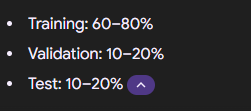

CROSS VALIDATION

In [30]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
import numpy as np
import warnings
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
# Suppress warnings
warnings.filterwarnings("ignore")

# Instantiating the models and storing them in a dictionary
models = {
    'Logistic Regression': LogisticRegression(),
    'Gaussian Naive Bayes': GaussianNB(),
    'K-Neighbors Classifier': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Support Vector Machine': SVC(probability=True),  # Probability set to True to return a non-NaN roc_auc
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
}

# Define scores to evaluate
scores = ["f1_weighted", "precision_weighted", "recall_weighted", "accuracy", "roc_auc_ovo_weighted"]

# Initialize a dictionary to store scores for each model
model_scores = {model_name: {score: [] for score in scores} for model_name in models.keys()}

# Split the data into training and testing sets
# Assuming features and target are already defined
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Initialize StratifiedKFold for cross-validation
n_splits = 10  # You can adjust this number as needed
skfold = StratifiedKFold(n_splits=n_splits, random_state=42, shuffle=True)

# For loop to evaluate the models
for model_name, model in models.items():
    print(f"Evaluating model: {model_name}")
    for score in scores:
        cv_scores = cross_val_score(model, X_train, y_train, cv=skfold, scoring=score)
        model_scores[model_name][score].append(np.mean(cv_scores))
        print(f"{score}: {np.mean(cv_scores):.4f}")
    print("\n")

# Print the scores for each model after evaluation
print("Model Scores:")
for model_name, scores in model_scores.items():
    print(f"{model_name}: {scores}")

# Determine the model with the best F1 score
best_model_name = max(model_scores.keys(), key=lambda x: model_scores[x]["f1_weighted"][0])
best_f1_score = model_scores[best_model_name]["f1_weighted"][0]

# Retrieve the model instance using the model name
best_model_instance = models[best_model_name]

# Print the best model and its F1 score
print(f"Best model based on F1 Score: {best_model_name} with F1 Score: {best_f1_score:.4f}")


Evaluating model: Logistic Regression
f1_weighted: 0.8860
precision_weighted: 0.8558
recall_weighted: 0.9185
accuracy: 0.9185
roc_auc_ovo_weighted: 0.3514


Evaluating model: Gaussian Naive Bayes
f1_weighted: 0.6619
precision_weighted: 0.7655
recall_weighted: 0.6484
accuracy: 0.6484
roc_auc_ovo_weighted: 0.3869


Evaluating model: K-Neighbors Classifier
f1_weighted: 0.8877
precision_weighted: 0.8561
recall_weighted: 0.9220
accuracy: 0.9220
roc_auc_ovo_weighted: 0.5786


Evaluating model: Decision Tree
f1_weighted: 0.8588
precision_weighted: 0.8594
recall_weighted: 0.8503
accuracy: 0.8400
roc_auc_ovo_weighted: 0.4922


Evaluating model: Support Vector Machine
f1_weighted: 0.8894
precision_weighted: 0.8563
recall_weighted: 0.9253
accuracy: 0.9253
roc_auc_ovo_weighted: 0.4358


Evaluating model: Random Forest
f1_weighted: 0.8894
precision_weighted: 0.8563
recall_weighted: 0.9253
accuracy: 0.9253
roc_auc_ovo_weighted: 0.5117


Evaluating model: Gradient Boosting
f1_weighted: 0.8808
precisi

**Extra Notes:**

Classification Metrics:

- Accuracy: Proportion of correct predictions out of total predictions. It's intuitive and straightforward but can be misleading with imbalanced datasets.
- Precision: Proportion of true positive predictions out of all positive predictions. Essential when the cost of false positives is high, such as in spam detection.
- Recall: Proportion of true positive predictions out of all actual positives. Critical when missing positive cases is costly, like in medical diagnoses.
- F1 Score: Harmonic mean of precision and recall. It provides a balanced measure, especially useful for imbalanced datasets.
- Specificity: Proportion of true negative predictions out of all actual negatives. Important in scenarios where false positives need to be minimized, such as in fraud detection.

Regression Metrics:
- Mean Squared Error (MSE): Average squared difference between predicted and actual values. It penalizes larger errors more due to squaring, making it sensitive to outliers.
- Root Mean Squared Error (RMSE): Square root of MSE. It maintains the same unit as the target variable, making interpretation more straightforward.
- Mean Absolute Error (MAE): Average absolute difference between predicted and actual values. Less sensitive to outliers and provides a simple measure of model performance.

Note:
Accuracy: This metric measures the proportion of correctly classified instances out of all instances. It's suitable when the class distribution is balanced and all classes are equally important.

Precision: Precision measures the proportion of true positive predictions out of all positive predictions. It's useful when the cost of false positives is high.

Recall (Sensitivity): Recall measures the proportion of true positive predictions out of all actual positive instances. It's valuable when the cost of false negatives is high.

F1 Score: The F1 score is the harmonic mean of precision and recall. It provides a balance between precision and recall and is suitable when there's an uneven class distribution.

ROC AUC: Receiver Operating Characteristic Area Under the Curve (ROC AUC) measures the area under the ROC curve, which plots the true positive rate against the false positive rate. It's suitable for binary classification problems, especially when class imbalance exists.

### Improving Accuracy

#### Hyperparameter tuning
Hyperparameter tuning is used to optimize the performance of machine learning models by searching for the best set of hyperparameters. Hyperparameters are settings that are not learned from the data but are set prior to training, such as the regularization strength in logistic regression, the depth of a decision tree, or the number of trees in a random forest.

Hyperparameter tuning is typically performed after selecting a model and before evaluating its performance on unseen data (e.g., a holdout test set). Here's a breakdown of the typical workflow involving hyperparameter tuning:

Based on the initial and hyperparameter-tuned model performances you provided, it seems that your initial model evaluations yielded much better scores compared to the hyperparameter tuning results. Here's a detailed analysis and guidance on what to do next:

Summary of Results
Initial Model Performance:

The Linear Discriminant Analysis model achieved the highest F1 Score of 0.75 and a decent ROC AUC of around 0.60.
Other models like Decision Tree, Logistic Regression, and Random Forest also performed well with F1 Scores above 0.73.
Hyperparameter-Tuned Model Performance:

The best-performing hyperparameter-tuned model, Random Forest, achieved an F1 Score of only 0.246.
Many models showed a significant drop in performance metrics across F1 Score, Precision, Recall, and ROC AUC.
Why the Drop in Performance?
Overfitting/Underfitting: The hyperparameter tuning process might have led to models that are overfitting the training data or underfitting by being too constrained.
Choice of Hyperparameters: The set of hyperparameters chosen for tuning may not be optimal for the dataset. It's essential to explore a wider range of hyperparameters or use different tuning strategies (e.g., grid search, random search).
Model Complexity: Some models may require specific tuning to perform well (e.g., Random Forests may need tuning of the number of trees, maximum depth, etc.).
Data Splitting: If the hyperparameter tuning involved different train-test splits, this could also lead to performance discrepancies.
Recommendations
Use Initial Findings: Given the substantial difference in scores, you should consider using the models from your initial evaluation. The Linear Discriminant Analysis model, in particular, shows strong performance and can be a good candidate for further analysis or deployment.

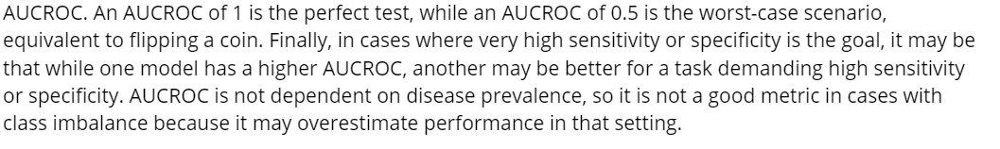

Alternative method to Improving Performnace is Ensemble methods 
Ensemble methods are techniques that combine multiple individual models to improve the overall predictive performance compared to any single model. They work by leveraging the wisdom of the crowd, where the collective decision of multiple models tends to be more accurate and robust than the decision of any individual model. Some popular ensemble methods for improving accuracy include:

Bagging (Bootstrap Aggregating):

Random Forest: Constructs multiple decision trees during training and outputs the mode of the classes as the prediction (classification) or average prediction (regression) of the individual trees.
Bagged Decision Trees: Similar to Random Forest but typically with decision trees as base learners.
Boosting:

AdaBoost (Adaptive Boosting): Iteratively trains weak classifiers (e.g., shallow decision trees) on different subsets of the training data, giving more weight to misclassified samples in subsequent iterations.
Gradient Boosting Machines (GBM): Builds an ensemble of trees sequentially, where each new tree corrects the errors made by the previous ones by fitting residuals.
Stacking (Stacked Generalization):

Stacked Ensemble: Combines the predictions of multiple models (base learners) using a meta-model (often logistic regression or another model) that learns how to best combine the predictions.
Voting:

Voting Classifier: Combines the predictions of multiple base classifiers (e.g., decision trees, SVMs, logistic regression) and predicts the class with the most votes (hard voting) or the class with the highest average probability (soft voting).
Bayesian Model Averaging (BMA):

Bayesian Voting: Instead of using equal weights for all models, assigns different weights to models based on their performance on validation data.

In [31]:
# 6. Finalize Model
# a) Predictions on validation dataset
# b) Create standalone model on entire training dataset
# c) Save model for later use

In [32]:
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import classification_report

# # Define the grid of hyperparameters for each model
# # param_grid_dc = {}  # DummyClassifier does not have hyperparameters
# param_grid_lr = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}
# param_grid_nb = {}  # GaussianNB does not have hyperparameters
# param_grid_knn = {'n_neighbors': [3, 5, 7, 9]}
# param_grid_dt = {'max_depth': [None, 5, 10, 20]}
# param_grid_sv = {'C': [0.1, 1, 10], 'gamma': [0.1, 1, 10]}
# param_grid_rf = {'n_estimators': [50, 100, 200], 'max_depth': [None, 10, 20]}
# param_grid_gb = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}
# param_grid_ad = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}
# param_grid_lda = {}  # LinearDiscriminantAnalysis does not have hyperparameters

# # Define models to tune
# models_to_tune = {'Logistic Regression': (lr, param_grid_lr),
#                   'Gaussian Naive Bayes': (nb, param_grid_nb),
#                   'K-Nearest Neighbors': (knn, param_grid_knn),
#                   'Decision Tree': (dt, param_grid_dt),
#                   'Support Vector Classifier': (sv, param_grid_sv),
#                   'Random Forest': (rf, param_grid_rf),
#                   'Gradient Boosting': (gb, param_grid_gb)
# }

# # Perform grid search for each model
# best_models = {}
# model_scores = {}

# for name, (model, param_grid) in models_to_tune.items():
#     grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='f1')
#     grid_search.fit(X_train, y_train)
#     best_models[name] = grid_search.best_estimator_
#     model_scores[name] = grid_search.best_score_
    
# # Sort models based on their scores (from best to worst)
# sorted_models = sorted(model_scores.items(), key=lambda x: x[1], reverse=True)

# # Print the sorted list of models with their scores
# for name, score in sorted_models:
#     print(f"{name}: {score}")

# # Select the best model
# best_model_name = sorted_models[0][0]
# best_model_f1 = best_models[best_model_name]
# print(f"\nBest Model Selected: {best_model_name}")

# # List to store mean f1 score for each model
# mean_test_f1 = []

# # Loop through each model and perform grid search with cross-validation
# for name, (model, param_grid) in models_to_tune.items():
#     grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='f1')
#     grid_search.fit(X_train, y_train)
#     mean_test_f1.append(grid_search.cv_results_['mean_test_score'])

# # Create a box plot
# plt.figure(figsize=(12, 8))
# sns.boxplot(data=mean_test_f1)
# plt.title('Performance of Models with Hyperparameter Tuning (f1 score)')
# plt.xlabel('Models')
# plt.ylabel('Mean f1 score')
# plt.xticks(range(len(models_to_tune)), models_to_tune.keys(), rotation=45)
# plt.grid(True)
# plt.show()

PERFORMANCE ON TEST DATA


Evaluation Metrics on Test Dataset:
Accuracy: 0.8784
Precision: 0.7715
Recall: 0.8784
F1-score: 0.8215
AUC: 0.5000


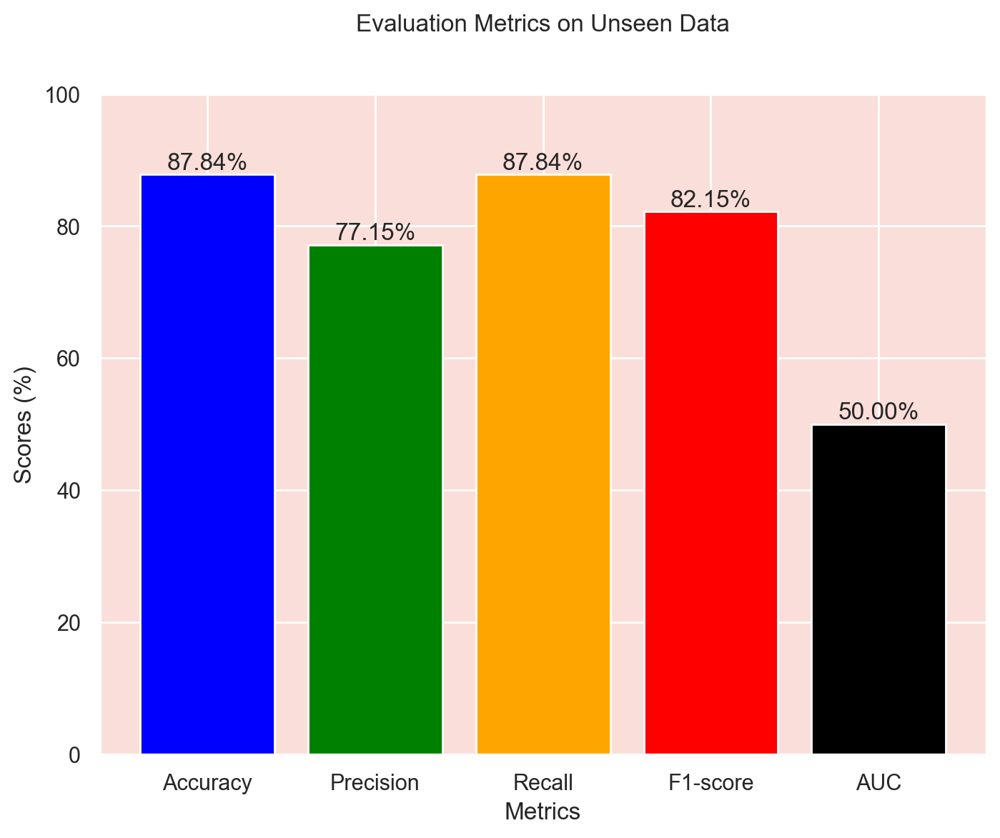

In [33]:
# Fit the best model on the training data
best_model_instance.fit(X_train, y_train)

# Make predictions on the test dataset
y_pred_test = best_model_instance.predict(X_test)

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred_test)
precision = precision_score(y_test, y_pred_test, average='weighted')
recall = recall_score(y_test, y_pred_test, average='weighted')
f1 = f1_score(y_test, y_pred_test, average='weighted')
roc_auc = roc_auc_score(y_test, y_pred_test)  # Calculate AUC

# Print evaluation metrics
print(f"\nEvaluation Metrics on Test Dataset:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1:.4f}")
print(f"AUC: {roc_auc:.4f}")

# Prepare data for the metrics plot
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-score', 'AUC']
values = [accuracy, precision, recall, f1, roc_auc]

# Multiply scores by 100 to convert to percentage
scores_percentage = [value * 100 for value in values]

# Create bar plot
plt.figure(figsize=(8, 6))
bars = plt.bar(metrics, scores_percentage, color=['blue', 'green', 'orange', 'red', 'black'])

# Add more space between the chart title and the bar graph
plt.title('Evaluation Metrics on Unseen Data\n\n')

plt.xlabel('Metrics')
plt.ylabel('Scores (%)')  # Adjust y-axis label to indicate percentage
plt.ylim(0, 100)  # Set y-axis limit to range between 0 and 100 for percentages

# Add value labels on top of the bars
for bar, score in zip(bars, scores_percentage):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), '{:.2f}%'.format(score),
             ha='center', va='bottom')

plt.show()

### FEATURE IMPORTANCE 


Feature importance is a technique used to understand which features have the most impact on a model's predictions. It helps in feature selection, model interpretation, identifying data quality issues, and gaining business insights.

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_feature_importances(model, features):
    """
    Plot feature importances for the given model.
    
    Parameters:
        model (object): The trained model for which feature importances are to be plotted.
        features (DataFrame): DataFrame containing the features used for training.
    """
    # Check if the model supports feature importances
    if hasattr(model, 'feature_importances_'):
        # Get feature importances
        feature_importances = model.feature_importances_
        
        # Assuming your features are stored in a DataFrame 'features' with column names
        feature_names = features.columns
        
        # Create a DataFrame to display feature importances
        feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
        
        # Sort the DataFrame by importance in descending order
        feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
        
        # Print or visualize the feature importances
        print("Feature Importances:")
        print(feature_importance_df)

                # Plot feature importances
        plt.figure(figsize=(10, 6))
        sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
        plt.title('Feature Importances')
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.show()
    else:
        print("Feature importances are not available for this model.")

# Assuming 'best_model' is the trained model and 'features' is the DataFrame containing features
plot_feature_importances(best_model_instance, features)

Feature importances are not available for this model.


What are SHAP Values?
SHAP (SHapley Additive exPlanations) values are a way to explain the output of any machine learning model. It uses a game theoretic approach that measures each player's contribution to the final outcome. In machine learning, each feature is assigned an importance value representing its contribution to the model's output.

SHAP values show how each feature affects each final prediction, the significance of each feature compared to others, and the model's reliance on the interaction between features.

By default a SHAP bar plot will take the mean absolute value of each feature over all the instances (rows) of the dataset.

But the mean absolute value is not the only way to create a global measure of feature importance, we can use any number of transforms. Here we show how using the max absolute value highights the Loss features, since they have infrequent but high magnitude effects.

The shap.plots.heatmap(shap_values[:1000]) function generates a heatmap visualization of SHAP values for a subset of data (the first 1,000 instances in this case). In this plot, features are displayed on one axis, and the individual samples are shown on the other. The color intensity indicates the magnitude of the SHAP values, allowing for a quick visual assessment of how different features affect the model's predictions across multiple instances. This visualization helps identify patterns in feature influence, revealing how features interact and contribute to predictions in different scenarios.

The shap.summary_plot(shap_values, X_test) function creates a visual summary of feature importance in a model by displaying SHAP (SHapley Additive exPlanations) values. It ranks features on the y-axis based on their average impact on predictions, while the x-axis shows the SHAP values, indicating each feature's contribution to model output. Points are color-coded to reflect feature values, helping to illustrate how each feature influences predictions, whether positively or negatively. This plot effectively conveys insights into feature significance and model behavior.

In [35]:
import shap

# Compute SHAP values
explainer = shap.Explainer(best_model_instance, X_train)
shap_values = explainer(X_test)

# Set a display version of the data to use for plotting (has string values)
shap_values.display_data = shap.datasets.adult(display=True)[0].values

# Plot SHAP values
shap.plots.bar(shap_values)

TypeError: The passed model is not callable and cannot be analyzed directly with the given masker! Model: SVC(probability=True)

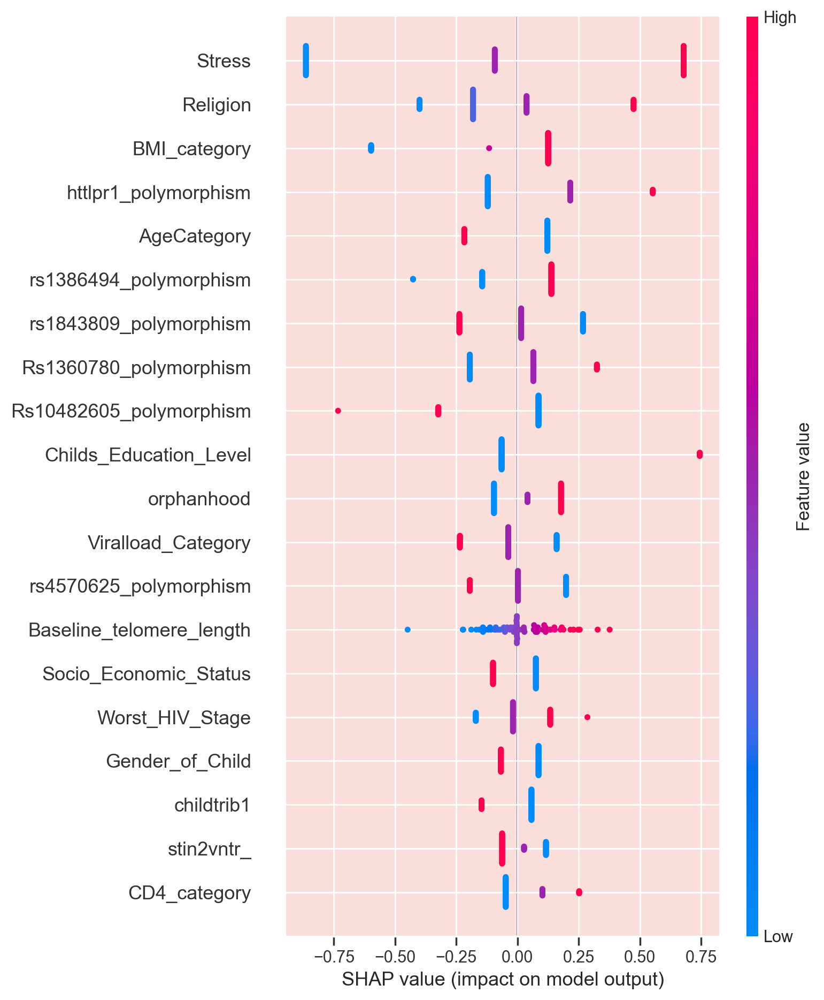

In [42]:
shap.summary_plot(shap_values, X_test)



In [43]:
import shap

# Use KernelExplainer for a model that is not natively supported by SHAP
explainer = shap.KernelExplainer(best_model_instance.predict, X_train)  # Use the predict method of the model

# Compute SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# Plot SHAP summary plot (bar or beeswarm)
shap.summary_plot(shap_values, X_test)

# Optional: You can also create a bar plot if you specifically want to display feature importance as a bar plot
shap.summary_plot(shap_values, X_test, plot_type="bar")


Using 294 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/74 [00:00<?, ?it/s]